# Setup

In [1]:
import pickle,gzip,math,os,time,shutil,torch,random,timm,torchvision,io,PIL
import fastcore.all as fc,matplotlib as mpl,numpy as np,matplotlib.pyplot as plt
from collections.abc import Mapping
from pathlib import Path
from operator import attrgetter,itemgetter
from functools import partial
from copy import copy
from contextlib import contextmanager

import torchvision.transforms.functional as TF,torch.nn.functional as F
from torchvision import transforms
from torch import tensor,nn,optim
from torch.utils.data import DataLoader,default_collate
from torch.nn import init
from torch.optim import lr_scheduler
from torcheval.metrics import MulticlassAccuracy
from datasets import load_dataset,load_dataset_builder
from fastcore.foundation import L, store_attr

from miniai.datasets import *
from miniai.conv import *
from miniai.learner import *
from miniai.activations import *
from miniai.init import *
from miniai.sgd import *
from miniai.resnet import *

/Users/bytedance/venv/lib/python3.13/site-packages/torch/cuda/__init__.py:63: FutureWarning: The pynvml package is deprecated. Please install nvidia-ml-py instead. If you did not install pynvml directly, please report this to the maintainers of the package that installed pynvml for you.
  import pynvml  # type: ignore[import]


In [2]:
# Image URLs for demos. Change as desired.
face_url = "https://images.pexels.com/photos/2690323/pexels-photo-2690323.jpeg?w=256"
spiderweb_url = "https://images.pexels.com/photos/34225/spider-web-with-water-beads-network-dewdrop.jpg?w=256"

# Loading Images

In [3]:
def download_image(url):
    imgb = fc.urlread(url, decode=False) 
    return torchvision.io.decode_image(tensor(list(imgb), dtype=torch.uint8)).float()/255.

content_im.shape: torch.Size([3, 256, 256])


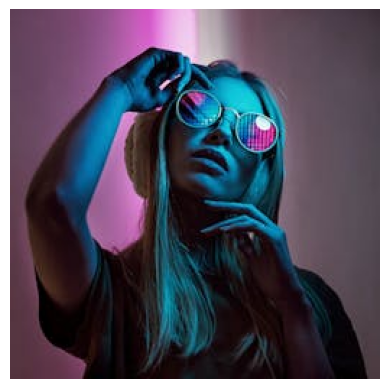

In [4]:
content_im = download_image(face_url).to(def_device)
print('content_im.shape:', content_im.shape)
show_image(content_im);

In [6]:
content_im.min(),content_im.max() # Check bounds

(tensor(0., device='mps:0'), tensor(1., device='mps:0'))

# Optimizing Images

In [ ]:
# ============================================================
# 关键思路：图像优化不需要真实数据集
# 我们要优化的目标是「图像本身的像素」，而不是模型权重
# 因此训练循环里的 dataloader 只是为了驱动 miniai 的 Learner 框架
# 数据集只需要「有长度」就够了，每次返回的 (0, 0) 是占位符，实际不用
# ============================================================

class LengthDataset():
    """一个只有长度的虚拟数据集，用于驱动训练循环"""
    def __init__(self, length=1): self.length=length
    def __len__(self): return self.length
    def __getitem__(self, idx): return 0, 0  # 返回占位符，ImageOptCB 不会用到它

def get_dummy_dls(length=100):
    """生成虚拟 DataLoaders，train 长度=length（即训练步数），valid 长度=1"""
    return DataLoaders(
        DataLoader(LengthDataset(length), batch_size=1),  # 训练集：控制优化步数
        DataLoader(LengthDataset(1), batch_size=1)        # 验证集：仅 1 步，跑一次验证
    )

print('虚拟数据集演示：')
ds = LengthDataset(100)
print(f'  数据集长度: {len(ds)}')
print(f'  取第 0 条数据: {ds[0]}  ← 只是占位符，不参与实际计算')
print('  → 训练循环将跑 100 步，每步都用 ImageOptCB 覆盖预测值')


虚拟数据集演示：
  数据集长度: 100
  取第 0 条数据: (0, 0)  ← 只是占位符，不参与实际计算
  → 训练循环将跑 100 步，每步都用 ImageOptCB 覆盖预测值


In [17]:
# ============================================================
# TensorModel：把一张图像变成「可训练参数」
# 核心技巧：用 nn.Parameter 包装张量，PyTorch 就会对它求梯度
# 这样 Adam 优化器就能直接更新图像像素，而非网络权重
# ============================================================

class TensorModel(nn.Module):
    def __init__(self, t):
        super().__init__()
        # nn.Parameter：告诉 PyTorch「这个张量需要求梯度并被优化」
        # t.clone()：复制一份，避免修改原始图像
        self.t = nn.Parameter(t.clone())

    def forward(self, x=0):
        # x 是来自虚拟数据集的占位符 (0)，直接忽略
        # 每次前向传播就是「返回当前图像的像素值」
        return self.t

print('TensorModel 的工作原理：')
print('  普通神经网络优化的是「权重」→ 输入固定，调整网络')
print('  TensorModel  优化的是「图像像素」→ 损失函数固定，调整输入图像')
print('  nn.Parameter 就是这个魔法的关键！')


TensorModel 的工作原理：
  普通神经网络优化的是「权重」→ 输入固定，调整网络
  TensorModel  优化的是「图像像素」→ 损失函数固定，调整输入图像
  nn.Parameter 就是这个魔法的关键！


初始随机图像信息：
  图像形状: torch.Size([3, 256, 256])  → (C, H, W) = (3通道, 256高, 256宽)
  像素值范围: [0.000, 1.000]
  可学习参数数量: 196608  → 即 3×256×256 个像素
  ↓ 优化前：纯随机噪声 ↓


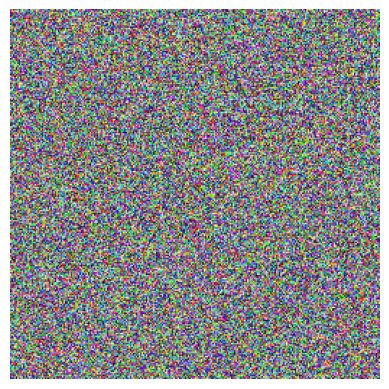

In [18]:
# 用随机噪声初始化「待优化图像」（与 content_im 形状相同）
# torch.rand_like(content_im) 生成与 content_im 相同 shape/device 的随机张量 [0,1)
model = TensorModel(torch.rand_like(content_im))

print('初始随机图像信息：')
print(f'  图像形状: {model().shape}  → (C, H, W) = (3通道, 256高, 256宽)')
print(f'  像素值范围: [{model().min().item():.3f}, {model().max().item():.3f}]')
print(f'  可学习参数数量: {sum(p.numel() for p in model.parameters())}  → 即 3×256×256 个像素')
print('  ↓ 优化前：纯随机噪声 ↓')
show_image(model());


In [19]:
# 查看 TensorModel 中所有可学习参数的形状
# 结果应该是 [torch.Size([3, 256, 256])]，即整张图像就是一个参数
shapes = [p.shape for p in model.parameters()]
print('模型参数形状列表:', shapes)
print(f'参数总数: {sum(p.numel() for p in model.parameters())}  （= 3 × 256 × 256）')
print('对比普通分类网络（如 ResNet50）参数量 ~25M，这里只有 19.6 万个「像素参数」')


模型参数形状列表: [torch.Size([3, 256, 256])]
参数总数: 196608  （= 3 × 256 × 256）
对比普通分类网络（如 ResNet50）参数量 ~25M，这里只有 19.6 万个「像素参数」


In [33]:
# ============================================================
# ImageOptCB：图像优化专用回调
# miniai 的 TrainCB 已实现了大部分训练逻辑，这里只需覆盖两个方法
#
# 对比普通训练：
#   普通训练：predict = model(xb)         → 用输入数据算预测值
#   图像优化：predict = model()           → 忽略输入，直接返回当前图像
#
#   普通训练：loss = loss_func(preds, yb) → 预测 vs 真实标签
#   图像优化：loss = loss_func(preds)     → 只需要图像本身（目标图已存在loss_func里）
# ============================================================

class ImageOptCB(TrainCB):
    def predict(self, learn):
        # 覆盖 predict：不用 xb，直接返回当前「图像参数」
        learn.preds = learn.model()

    def get_loss(self, learn):
        # 覆盖 get_loss：损失函数只接受图像本身（目标已在 loss_func 闭包中）
        learn.loss = learn.loss_func(learn.preds)

print('ImageOptCB 覆盖了 TrainCB 的 predict 和 get_loss 两个钩子：')
print('  predict  → learn.preds = model()        （无视 dataloader 返回的占位符）')
print('  get_loss → learn.loss  = loss_func(preds)（目标图像在 loss_func 闭包里）')


ImageOptCB 覆盖了 TrainCB 的 predict 和 get_loss 两个钩子：
  predict  → learn.preds = model()        （无视 dataloader 返回的占位符）
  get_loss → learn.loss  = loss_func(preds)（目标图像在 loss_func 闭包里）


In [34]:
# ============================================================
# ImageLogCB：中间过程记录回调
# 每隔 log_every 步把当前图像存入 self.images 列表
# after_fit 结束后把所有记录的图像拼成一个网格展示，直观呈现优化轨迹
# ============================================================

class ImageLogCB(Callback):
    # 设定执行顺序在 ProgressCB 之后，确保进度条已更新
    order = ProgressCB.order + 1

    def __init__(self, log_every=10):
        store_attr()      # 自动存储 self.log_every
        self.images = []  # 记录每隔 log_every 步的图像快照
        self.i = 0        # 全局步计数器

    def after_batch(self, learn):
        # 每个 batch 后：若到达记录时刻，则保存当前预测图像
        if self.i % self.log_every == 0:
            # to_cpu：确保图像回到 CPU 再存储（训练可能在 GPU/MPS 上）
            # clip(0,1)：裁剪到合法显示范围，避免显示时颜色异常
            self.images.append(to_cpu(learn.preds.clip(0, 1)))
        self.i += 1

    def after_fit(self, learn):
        # 训练结束后展示所有记录的图像快照（优化过程的「电影胶卷」）
        print(f'共记录了 {len(self.images)} 张中间图像（每 {self.log_every} 步一张）')
        show_images(self.images)


In [ ]:
# ============================================================
# 第一个图像优化实验：用 MSE Loss 还原 content_im
#
# 目标：从随机噪声出发，优化图像使其像素值尽量接近 content_im
# 损失：F.mse_loss(当前图像, 目标图像) → 逐像素 L2 误差
# 预期：100 步 Adam 优化后图像应该逐渐变清晰
# ============================================================

def loss_fn_mse(im):
    """计算当前图像与目标图像的均方误差（逐像素比较）"""
    return F.mse_loss(im, content_im)

# 从随机噪声出发
model = TensorModel(torch.rand_like(content_im))

# 组装固定回调列表（不含日志回调，日志回调单独传入 fit）
cbs = [
    ImageOptCB(),   # 图像优化专用（覆盖 predict/get_loss）
    ProgressCB(),   # 显示进度条
    MetricsCB(),    # 记录并显示 loss
    DeviceCB(),     # 自动将数据移至正确设备（mps/cuda/cpu）
]

# 创建日志回调实例，方便训练结束后访问 image_log_cb.images
image_log_cb = ImageLogCB(log_every=10)

learn = Learner(
    model,
    get_dummy_dls(199),      # 100 步优化
    loss_fn_mse,
    lr=1e-2,
    cbs=cbs,
    opt_func=torch.optim.Adam
)


开始 MSE 图像优化...
  初始像素 → 随机噪声
  优化目标 → 最小化 ||当前图像 - content_im||²
  优化器   → Adam, lr=0.01
  步数     → 100 步，每 10 步记录一次中间图像


loss,epoch,train
0.021,0,train
0.000,0,eval


共记录了 20 张中间图像（每 10 步一张）


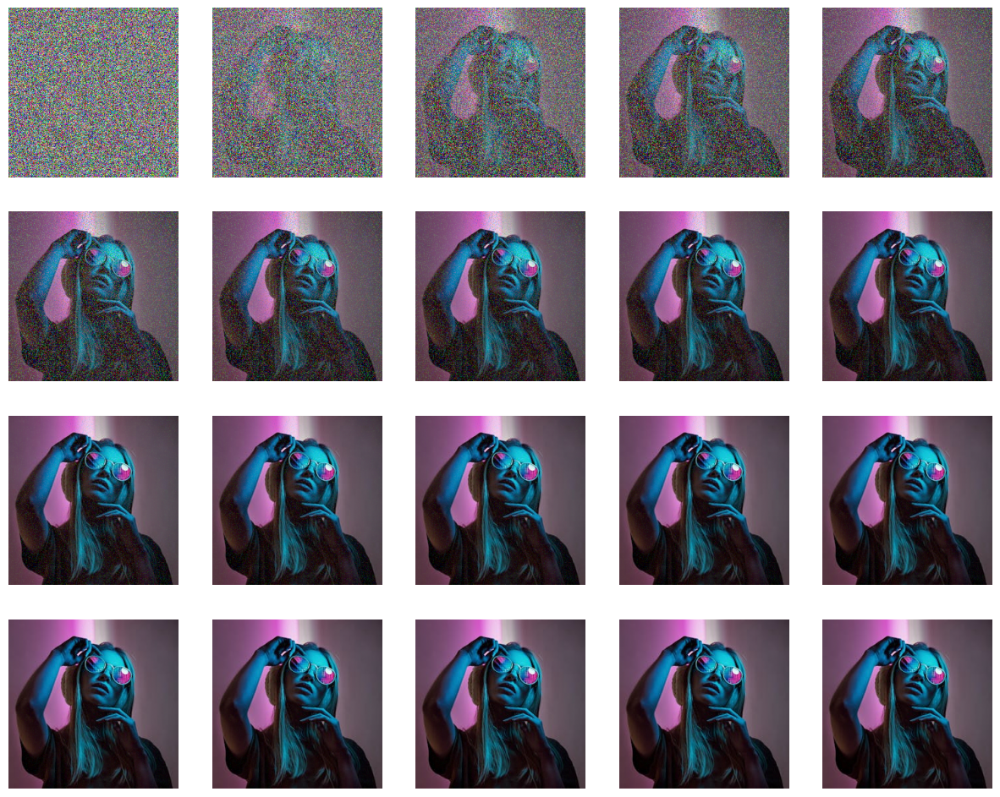

In [43]:

print('开始 MSE 图像优化...')
print('  初始像素 → 随机噪声')
print('  优化目标 → 最小化 ||当前图像 - content_im||²')
print('  优化器   → Adam, lr=0.01')
print('  步数     → 100 步，每 10 步记录一次中间图像')
# 额外传入 image_log_cb，训练结束后自动展示 10 张进度图
learn.fit(1, cbs=[image_log_cb])


=== 优化完成 ===
  裁剪前像素范围: [0.0000, 1.0000]
  最终 MSE loss : 0.177835
  共记录中间图像: 0 张

左图: 优化后图像（100步Adam）   右图: 目标图像
→ MSE Loss 直接优化像素，100 步后图像应该非常接近目标


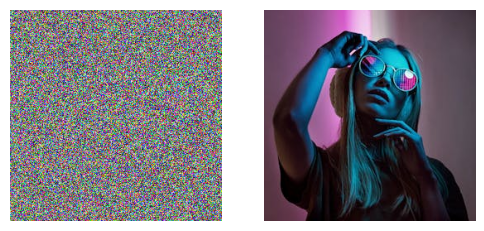

In [49]:
# 最终结果对比：优化后图像（左）vs 目标图像（右）
# clip(0, 1)：将像素值裁剪到合法显示范围（优化过程可能超出 [0,1]）
optimized = learn.model().clip(0, 1)

print('=== 优化完成 ===')
print(f'  裁剪前像素范围: [{learn.model().min().item():.4f}, {learn.model().max().item():.4f}]')
print(f'  最终 MSE loss : {loss_fn_mse(learn.model()).item():.6f}')
print(f'  共记录中间图像: {len(image_log_cb.images)} 张')
print()
print('左图: 优化后图像（100步Adam）   右图: 目标图像')
print('→ MSE Loss 直接优化像素，100 步后图像应该非常接近目标')
show_images([optimized, content_im]);


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.4684601e-05..1.0000131].


Loss: 0.1773
Loss: 0.0190
Loss: 0.0014
Loss: 0.0001
Loss: 0.0000
Loss: 0.0000


<Axes: >

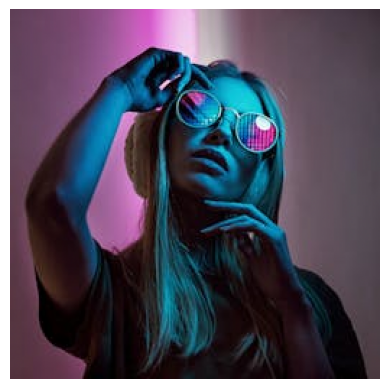

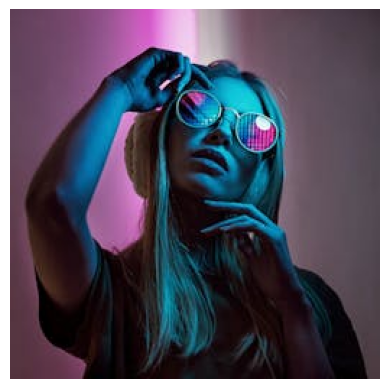

In [51]:
# Simplest non miniai version of image optimization
opt_im = torch.rand_like(content_im).to(def_device) # Random pixels
opt_im.requires_grad = True
opt = torch.optim.Adam([opt_im], lr=1e-2)

for i in range(300):
    loss = torch.nn.functional.mse_loss(opt_im, content_im)
    if i % 50 == 0:
        print(f'Loss: {loss.item():.4f}')
    loss.backward()
    opt.step()
    opt.zero_grad()

show_image(opt_im)
show_image(content_im)

## Viewing progress

It would be great if we could see what is happening over time. You could save individual images and turn them into a video, but for quick feedback we can also log images every few iterations and display them in a grid in `after_fit`:

In [52]:
class ImageLogCB(Callback):
    order = ProgressCB.order + 1
    def __init__(self, log_every=10): store_attr(); self.images=[]; self.i=0
    def after_batch(self, learn): 
        if self.i%self.log_every == 0: self.images.append(to_cpu(learn.preds.clip(0, 1)))
        self.i += 1
    def after_fit(self, learn): show_images(self.images)

loss,epoch,train
0.028,0,train
0.000,0,eval


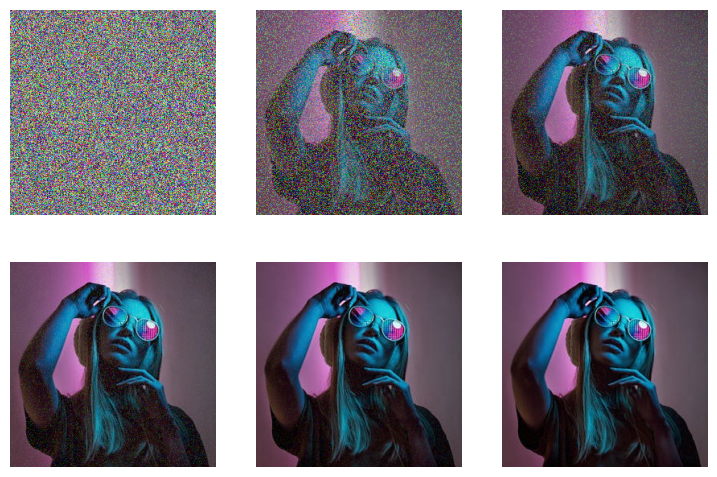

In [53]:
model = TensorModel(torch.rand_like(content_im))
learn = Learner(model, get_dummy_dls(150), loss_fn_mse, 
                lr=1e-2, cbs=cbs, opt_func=torch.optim.Adam)
learn.fit(1, cbs=[ImageLogCB(30)])

## Getting Features from VGG16

We're going to peek inside a small CNN and extract the outputs of different layers.

### Load VGG network

![vgg diag](https://neurohive.io/wp-content/uploads/2018/11/vgg16-1-e1542731207177.png)

In [54]:
print(timm.list_models('*vgg*'))

['repvgg_a0', 'repvgg_a1', 'repvgg_a2', 'repvgg_b0', 'repvgg_b1', 'repvgg_b1g4', 'repvgg_b2', 'repvgg_b2g4', 'repvgg_b3', 'repvgg_b3g4', 'repvgg_d2se', 'vgg11', 'vgg11_bn', 'vgg13', 'vgg13_bn', 'vgg16', 'vgg16_bn', 'vgg19', 'vgg19_bn']


In [55]:
vgg16 = timm.create_model('vgg16', pretrained=True).to(def_device).features

model.safetensors:   0%|          | 0.00/553M [00:00<?, ?B/s]

In [77]:
vgg16

Sequential(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU(inplace=True)
  (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (3): ReLU(inplace=True)
  (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (6): ReLU(inplace=True)
  (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (8): ReLU(inplace=True)
  (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): ReLU(inplace=True)
  (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (13): ReLU(inplace=True)
  (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (15): ReLU(inplace=True)
  (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (17): Conv2d(256, 512, kernel_si

### Normalize Images

This model expacts images normalized with the same stats as those used during training, which in this case requires the stats of the ImageNet dataset. Previously we were working with single-channel images, and so normalizing was pretty straightforward. With three channels, we need to think a bit more about shapes and boradcasting rules:

In [60]:
imagenet_mean = tensor([0.485, 0.456, 0.406])
imagenet_std = tensor([0.229, 0.224, 0.225])
content_im.shape, imagenet_mean.unsqueeze(1).unsqueeze(2).shape

(torch.Size([3, 256, 256]), torch.Size([3, 1, 1]))

In [ ]:
# Try 1 (won't work):
# (content_im - imagenet_mean) / imagenet_std

In [ ]:
imagenet_mean.shape

torch.Size([3])

In [ ]:
content_im.shape

torch.Size([3, 256, 256])

In [69]:
imagenet_mean[:,None,None].shape
content_im.shape, content_im.mean(dim=(1, 2)), content_im.std(dim=(1, 2))


(torch.Size([3, 256, 256]),
 tensor([0.2623, 0.2411, 0.3117], device='mps:0'),
 tensor([0.2134, 0.1711, 0.2209], device='mps:0'))

In [70]:
# Try 2:
def normalize(im):
    imagenet_mean = tensor([0.485, 0.456, 0.406])[:,None,None].to(im.device)
    imagenet_std = tensor([0.229, 0.224, 0.225])[:,None,None].to(im.device)
    return (im - imagenet_mean) / imagenet_std

In [71]:
normalize(content_im).min(), normalize(content_im).max()

(tensor(-2.1179, device='mps:0'), tensor(2.6400, device='mps:0'))

In [72]:
normalize(content_im).mean(dim=(1, 2))

tensor([-0.9724, -0.9594, -0.4191], device='mps:0')

In [73]:
# And with torchvision transforms:
normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])

In [74]:
normalize(content_im).min(), normalize(content_im).max()

(tensor(-2.1179, device='mps:0'), tensor(2.6400, device='mps:0'))

### Get intermediate representations, take 1:

We want to feed some data through the network, storing thr outputs of different layers. Here's one way to do this:

In [75]:
def calc_features(imgs, target_layers=(18, 25)): 
    x = normalize(imgs)
    feats = []
    for i, layer in enumerate(vgg16[:max(target_layers)+1]):
        x = layer(x)
        if i in target_layers:
            feats.append(x.clone())
    return feats

In [82]:
# Testing it out to see the shapes of the resulting feature maps:
feats = calc_features(content_im)
content_im.shape, [f.shape for f in feats], [(x.shape, y.shape) for x, y in list(zip(feats, feats))]

(torch.Size([3, 256, 256]),
 [torch.Size([512, 32, 32]), torch.Size([512, 16, 16])],
 [(torch.Size([512, 32, 32]), torch.Size([512, 32, 32])),
  (torch.Size([512, 16, 16]), torch.Size([512, 16, 16]))])

In [ ]:
# Homework: Can you do this using hooks?

### What's the point?

You may remember us looking at https://distill.pub/2017/feature-visualization/ and talking about how deep CNNs 'learn' to classify images. Early layers tend to capture gradients and textures, while later layers tend towards more complex types of feature. We're going to exploit this hierarchy for artistic purposes, but being able to choose what kind of feature you'd like to use when comparing images has a number of other useful applications. 

# Optimizing an Image with Content Loss

To start with, let's try optimizing an image by comparing it's features (from two later layers) with those from the target image. If our theory is right, we should see the structure of the target emerge from the noise without necessarily seeing a perfect re-production of the target like we did in the previous MSE loss example.

In [83]:
class ContentLossToTarget():
    def __init__(self, target_im, target_layers=(18, 25)):
        fc.store_attr()
        with torch.no_grad():
            self.target_features = calc_features(target_im, target_layers)
    def __call__(self, input_im): 
        return sum((f1-f2).pow(2).mean() for f1, f2 in 
               zip(calc_features(input_im, self.target_layers), self.target_features))

loss,epoch,train
4.789,0,train
1.477,0,eval


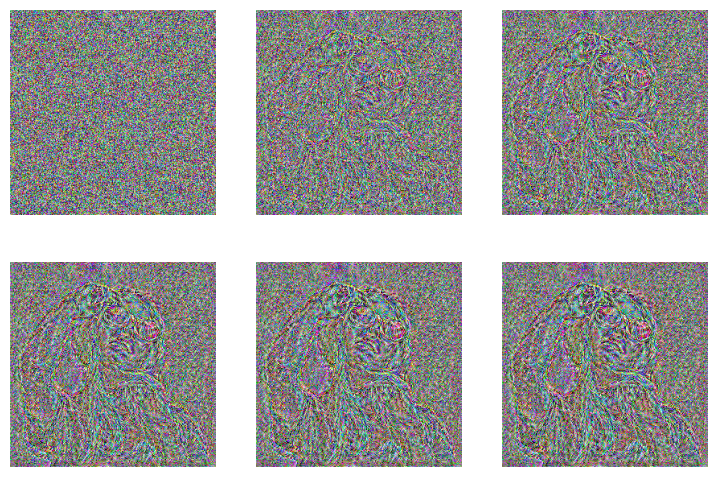

In [86]:
loss_function_perceptual = ContentLossToTarget(content_im)
model = TensorModel(torch.rand_like(content_im))
learn = Learner(model, get_dummy_dls(150), loss_function_perceptual, 
                lr=1e-2, cbs=cbs, opt_func=torch.optim.Adam)
learn.fit(1, cbs=[ImageLogCB(log_every=30)])

**Choosing the layers determines the kind of features that are important:**

loss,epoch,train
2.360,0,train
0.364,0,eval


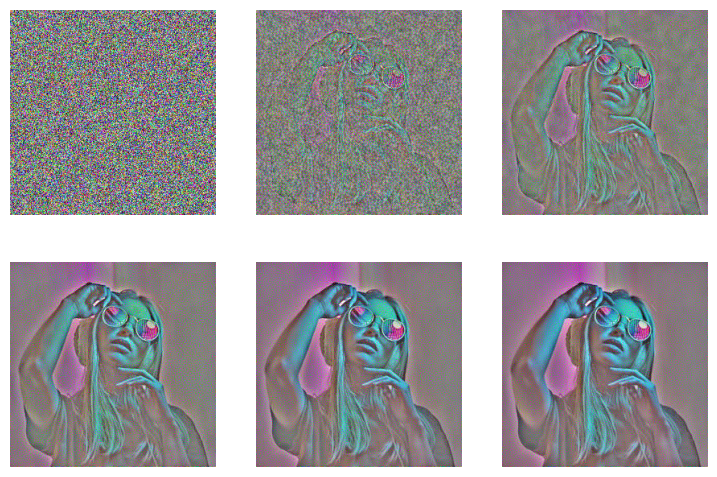

In [87]:
loss_function_perceptual = ContentLossToTarget(content_im, target_layers=(1, 6))
model = TensorModel(torch.rand_like(content_im))
learn = Learner(model, get_dummy_dls(150), loss_function_perceptual, 
                lr=1e-2, cbs=cbs, opt_func=torch.optim.Adam)
learn.fit(1, cbs=[ImageLogCB(log_every=30)])

# Style Loss with Gram Matrix

So, we know how to extract feature maps. The next thing we'd like to do is find a way to capture the **style** of an input image, based on those early layers and the kinds of textural feature that they learn. Unfortunately, we can't just compare the feature maps from some early layers since these 'maps' encode information spatially - which we don't want!

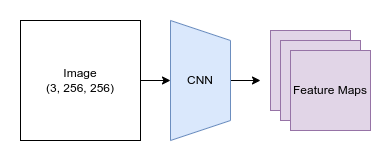

So, we need a way to measure what **kinds** of style features are present, and ideally which kinds occur together, without worrying about **where** these features occur in the image. 

Enter something called the Gram Matrix. The idea here is that we'll measure the **correlation** between features. Given a feature map with `f` features in an `h` x `w` grid, we'll flatten out the spatial component and then for every feature we'll take the dot product of that row with itself, giving an `f` x `f` matrix as the result. Each entry in this matrix quantifies how correlated the relevant pair of features are and how frequently they occur - exactly what we want. In this diagram each feature is represented as a colored dot.

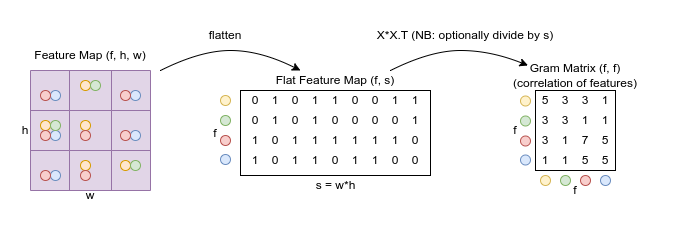

In [91]:





X = torch.tensor([
    [0, 1, 0, 1, 1, 0, 0, 1, 1],
    [0, 1, 0, 1, 0, 0, 0, 0, 1],
    [1, 0, 1, 1, 1, 1, 1, 1, 0],
    [1, 0, 1, 1, 0, 1, 1, 0, 0],
])
X@X.T

tensor([[5, 3, 3, 1],
        [3, 3, 1, 1],
        [3, 1, 7, 5],
        [1, 1, 5, 5]])

Re-creating the diagram operations in code:

In [ ]:
t = tensor([[0, 1, 0, 1, 1, 0, 0, 1, 1],
            [0, 1, 0, 1, 0, 0, 0, 0, 1],
            [1, 0, 1, 1, 1, 1, 1, 1, 0],
            [1, 0, 1, 1, 0, 1, 1, 0, 0]])

In [ ]:
torch.einsum('fs, gs -> fg', t, t)

tensor([[5, 3, 3, 1],
        [3, 3, 1, 1],
        [3, 1, 7, 5],
        [1, 1, 5, 5]])

In [ ]:
t.matmul(t.T) # Alternate approach

tensor([[5, 3, 3, 1],
        [3, 3, 1, 1],
        [3, 1, 7, 5],
        [1, 1, 5, 5]])

### Trying it out

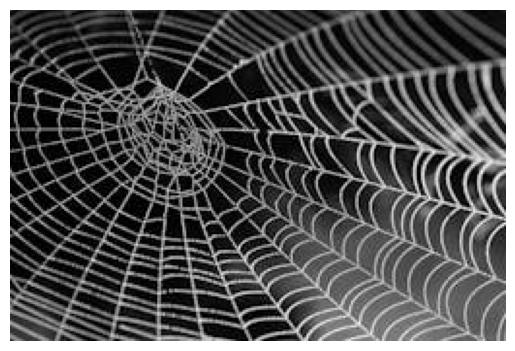

In [92]:
style_im = download_image(spiderweb_url).to(def_device)
show_image(style_im);

In [106]:
def calc_grams(img, target_layers=(1, 6, 11, 18, 25)):
    return L(torch.einsum('chw, dhw -> cd', x, x) / (x.shape[-2]*x.shape[-1]) # 'bchw, bdhw -> bcd' if batched
            for x in calc_features(img, target_layers))

In [104]:
# testing code
for x in calc_features(content_im, (1, 6, 11, 18, 25)):
    print(f'x.shape: {x.shape}, x.shape[-2]*x.shape[-1]: {x.shape[-2]*x.shape[-1]},  x[0].numel(): {x[0].numel()}')


x.shape: torch.Size([64, 256, 256]), x.shape[-2]*x.shape[-1]: 65536,  x[0].numel(): 65536
x.shape: torch.Size([128, 128, 128]), x.shape[-2]*x.shape[-1]: 16384,  x[0].numel(): 16384
x.shape: torch.Size([256, 64, 64]), x.shape[-2]*x.shape[-1]: 4096,  x[0].numel(): 4096
x.shape: torch.Size([512, 32, 32]), x.shape[-2]*x.shape[-1]: 1024,  x[0].numel(): 1024
x.shape: torch.Size([512, 16, 16]), x.shape[-2]*x.shape[-1]: 256,  x[0].numel(): 256


In [107]:
style_grams = calc_grams(style_im)

In [108]:
[g.shape for g in style_grams] # The gram matrices for features from different layers

[torch.Size([64, 64]),
 torch.Size([128, 128]),
 torch.Size([256, 256]),
 torch.Size([512, 512]),
 torch.Size([512, 512])]

In [109]:
style_grams.attrgot('shape') # The magic of fastcore's L

[torch.Size([64, 64]), torch.Size([128, 128]), torch.Size([256, 256]), torch.Size([512, 512]), torch.Size([512, 512])]

In [111]:
class StyleLossToTarget():
    def __init__(self, target_im, target_layers=(1, 6, 11, 18, 25)):
        fc.store_attr()
        with torch.no_grad(): self.target_grams = calc_grams(target_im, target_layers)
    def __call__(self, input_im): 
        return sum((f1-f2).pow(2).mean() for f1, f2 in 
               zip(calc_grams(input_im, self.target_layers), self.target_grams))

In [112]:
style_loss = StyleLossToTarget(style_im)

In [113]:
style_loss(content_im)

tensor(429.7957, device='mps:0', grad_fn=<AddBackward0>)

## Style Transfer

loss,epoch,train
59.403,0,train
41.889,0,eval


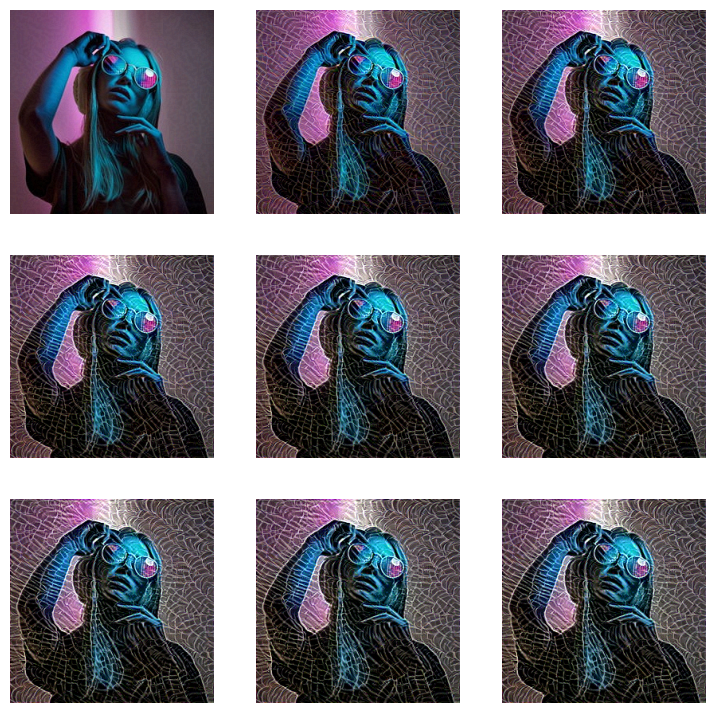

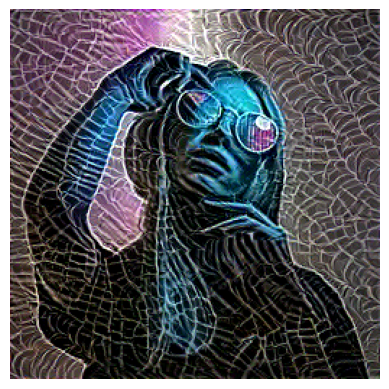

In [117]:
model = TensorModel(content_im) # Start from content image
style_loss = StyleLossToTarget(style_im)
content_loss = ContentLossToTarget(content_im)
def combined_loss(x):
    return style_loss(x) + content_loss(x)
learn = Learner(model, get_dummy_dls(299), combined_loss, lr=1e-2, cbs=cbs, opt_func=torch.optim.Adam)
learn.fit(1, cbs=[ImageLogCB(30)])

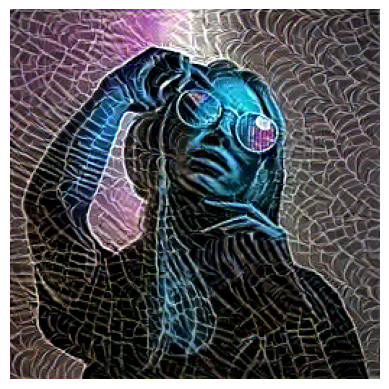

In [118]:
show_image(learn.model().clip(0, 1)); # View the final result

And trying with random starting image, weighting the style loss lower, using different layers:

loss,epoch,train
33.251,0,train
27.999,0,eval


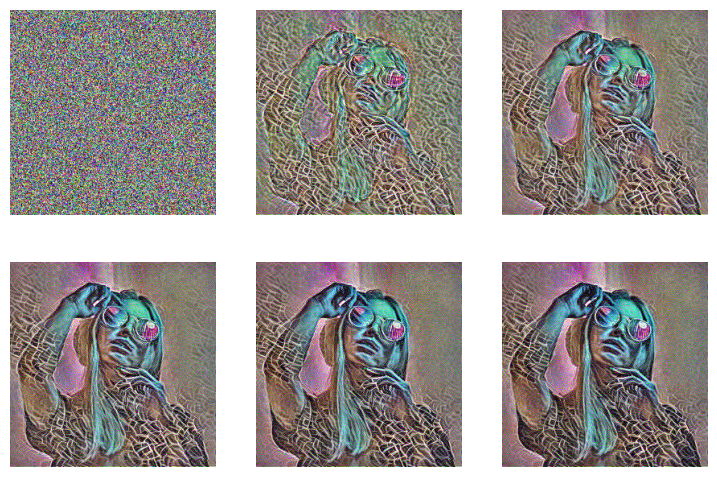

In [123]:
model = TensorModel(torch.rand_like(content_im))
style_loss = StyleLossToTarget(style_im)
content_loss = ContentLossToTarget(content_im, target_layers=(6, 18, 25))
def combined_loss(x):
    return style_loss(x) * 0.1 + content_loss(x)
learn = Learner(model, get_dummy_dls(300), combined_loss, lr=5e-2, cbs=cbs, opt_func=torch.optim.Adam)
learn.fit(1, cbs=[ImageLogCB(60)])

## For Comparison: non-miniai version

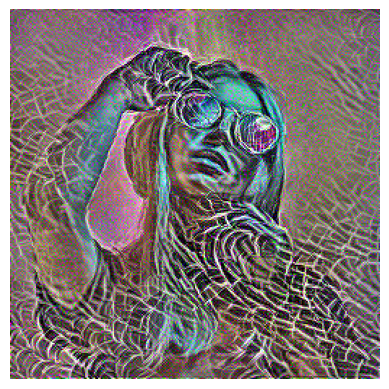

In [ ]:
# The image to be optimized
im = torch.rand(3, 256, 256).to(def_device)
im.requires_grad = True

# Set up the optimizer
opt = torch.optim.Adam([im], lr=5e-2)

# Define the loss function
style_loss = StyleLossToTarget(style_im)
content_loss = ContentLossToTarget(content_im, target_layers=[6, 18, 25])
def combined_loss(x):
    return style_loss(x) * 0.2 + content_loss(x)

# Optimization loop
for i in range(300):
    loss = combined_loss(im)
    loss.backward()
    opt.step()
    opt.zero_grad()
    
# Show the result
show_image(im.clip(0, 1));

What do you think are some pros and cons? How would this look once we start displaying progress, testing different configurations and so on?